Notebook for us to start working in. 

# PPOL 5203 Final Project

## 1. Import Data and Clean Columns

In [2]:
#!pip install openpyxl

In [141]:
import pandas as pd
import os
import openpyxl

In [29]:
#!pip install geopandas
#!pip install contextily

     ---------------------------------------- 0.0/40.3 kB ? eta -:--:--
     -------------------------------------- 40.3/40.3 kB 940.1 kB/s eta 0:00:00
   ---------------------------------------- 0.0/125.4 kB ? eta -:--:--
   ------------------- -------------------- 61.4/125.4 kB 1.7 MB/s eta 0:00:01
   ---------------------------------------  122.9/125.4 kB 1.2 MB/s eta 0:00:01
   -------------------------------------- 125.4/125.4 kB 921.6 kB/s eta 0:00:00
   ---------------------------------------- 0.0/23.4 MB ? eta -:--:--
   ---------------------------------------- 0.1/23.4 MB 1.1 MB/s eta 0:00:22
   ---------------------------------------- 0.1/23.4 MB 1.3 MB/s eta 0:00:18
   ---------------------------------------- 0.2/23.4 MB 1.2 MB/s eta 0:00:20
   ---------------------------------------- 0.2/23.4 MB 1.2 MB/s eta 0:00:20
   ---------------------------------------- 0.3/23.4 MB 1.3 MB/s eta 0:00:19
    --------------------------------------- 0.4/23.4 MB 1.3 MB/s eta 0:00:19
    --

In [142]:
import geopandas as gpd
import os
import matplotlib.pyplot as plt
import contextily

In [150]:
pwd

'C:\\Users\\bsullivan\\OneDrive - FI Consulting\\Documents\\GU\\Data Science 1\\NRI_Shapefile_Counties'

In [144]:
os.chdir("../")

In [147]:
os.chdir("../")

In [148]:
os.chdir('NRI_Shapefile_Counties')

In [149]:
shape_county = gpd.read_file('NRI_Shapefile_Counties.shp')

In [36]:
shape_county = shape_county[~shape_county.STATE.str.contains("American Samoa|Guam|Northern Mariana Islands|Virgin Islands|Puerto Rico")]
#shape_county.filter(columns = ["COUNTYFIPS", "geometry"])

In [151]:
os.chdir("../")
os.chdir("PPOL5203_FinalProject/Datasets/Clean_Data")

In [152]:
prediction_data = pd.read_csv("NRI_county_health_data_predictions.csv")
prediction_data_southeast = pd.read_csv("NRI_county_health_data_predictions_southeast.csv")

In [17]:
shape_county.head()

,NRI_ID,STATE,STATEABBRV,STATEFIPS,COUNTY,COUNTYTYPE,COUNTYFIPS,STCOFIPS,POPULATION,BUILDVALUE,...,WNTW_ALRP,WNTW_ALRA,WNTW_ALR_N,WNTW_RISKV,WNTW_RISKS,WNTW_RISKR,NRI_VER,Shape_Leng,Shape_Area,geometry
0,C01001,Alabama,AL,01,Autauga,County,001,01001,58764,9.123274e+09,...,7.410082e-09,8.725777e-06,10.461158,8494.906508,12.217626,Very Low,March 2023,249970.262434,2.208589e+09,"POLYGON ((-9619432.840 3847073.744, -9619428.2..."
1,C01003,Alabama,AL,01,Baldwin,County,003,01003,231365,4.596848e+10,...,2.287120e-08,1.548360e-07,13.339523,65619.701638,52.083996,Relatively Low,March 2023,923868.312116,5.730947e+09,"MULTIPOLYGON (((-9787951.364 3588674.829, -978..."
2,C01005,Alabama,AL,01,Barbour,County,005,01005,25160,4.847697e+09,...,2.347236e-08,7.606598e-07,16.125039,15501.730336,19.535476,Very Low,March 2023,320882.938340,3.257909e+09,"POLYGON ((-9491049.106 3781487.459, -9490968.1..."
3,C01007,Alabama,AL,01,Bibb,County,007,01007,22239,3.146947e+09,...,1.270300e-08,1.202015e-05,16.991643,7496.186940,11.104041,Very Low,March 2023,227920.125168,2.311979e+09,"POLYGON ((-9687669.284 3924165.445, -9687659.8..."
4,C01009,Alabama,AL,01,Blount,County,009,01009,58992,7.815620e+09,...,1.482016e-08,2.002965e-07,12.039616,17175.160729,21.444480,Very Low,March 2023,292630.369977,2.456906e+09,"POLYGON ((-9622917.941 4063649.874, -9622939.5..."


In [180]:
[col for col in shape_county.columns if "SCORE" in col]

['RISK_SCORE', 'EAL_SCORE', 'SOVI_SCORE', 'RESL_SCORE']

In [13]:
shape_county.columns

Index(['NRI_ID', 'STATE', 'STATEABBRV', 'STATEFIPS', 'COUNTY', 'COUNTYTYPE',
       'COUNTYFIPS', 'STCOFIPS', 'POPULATION', 'BUILDVALUE',
       ...
       'WNTW_ALRP', 'WNTW_ALRA', 'WNTW_ALR_N', 'WNTW_RISKV', 'WNTW_RISKS',
       'WNTW_RISKR', 'NRI_VER', 'Shape_Leng', 'Shape_Area', 'geometry'],
      dtype='object', length=467)

In [13]:
os.chdir("../")
os.chdir('PPOL5203_FinalProject/Final_Results')

In [14]:
pwd

'C:\\Users\\bsullivan\\OneDrive - FI Consulting\\Documents\\GU\\Data Science 1\\PPOL5203_FinalProject\\Final_Results'

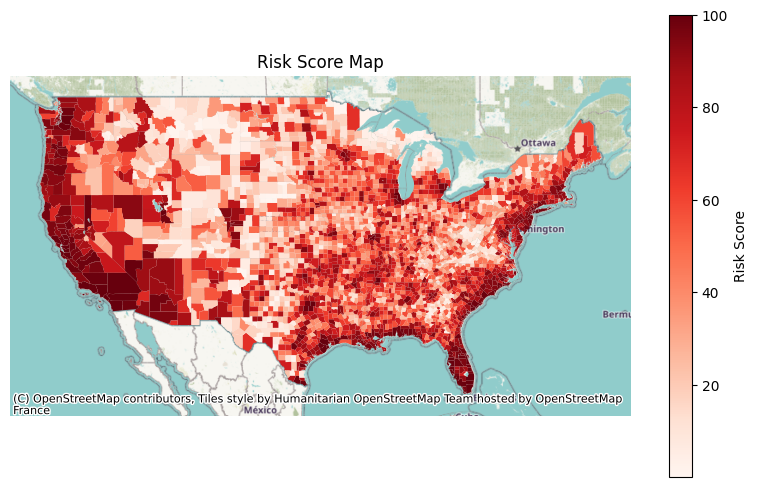

In [22]:
#Is one of these easier to comprehend than the other color-wise?

fig, ax = plt.subplots(figsize=(10,6))

gis_1 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'RISK_SCORE',
                                                                    cmap = 'Reds',
                                                                    legend = True, legend_kwds = {'label': "Risk Score"},
                                                                       ax=ax)

gis_1.set_axis_off()
gis_1.set_title('Risk Score Map')

contextily.add_basemap(ax)

plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

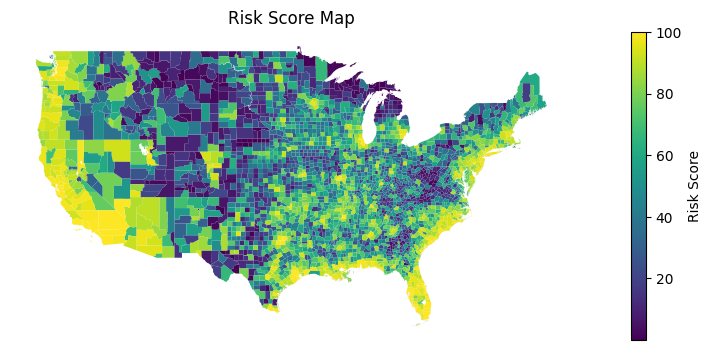

In [18]:
fig, ax = plt.subplots(figsize=(10,6))

gis_2 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'RISK_SCORE',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Risk Score"},
                                                                       ax=ax)

gis_2.set_axis_off()
gis_2.set_title('Risk Score Map')

contextily.add_basemap(ax)

plt.savefig('gis_riskscore_national_default.jpg')

plt.show()

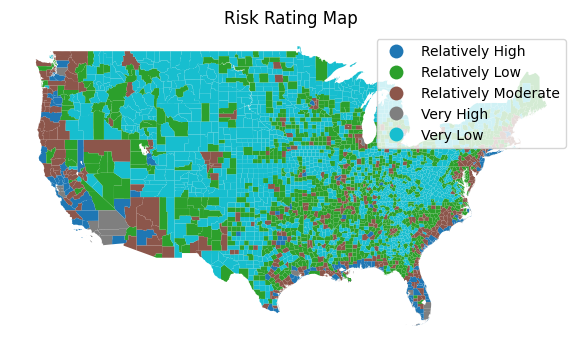

In [179]:
fig, ax = plt.subplots(figsize=(15,4))

gis_3 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'RISK_RATNG',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_3.set_axis_off()
gis_3.set_title('Risk Rating Map')

plt.show()

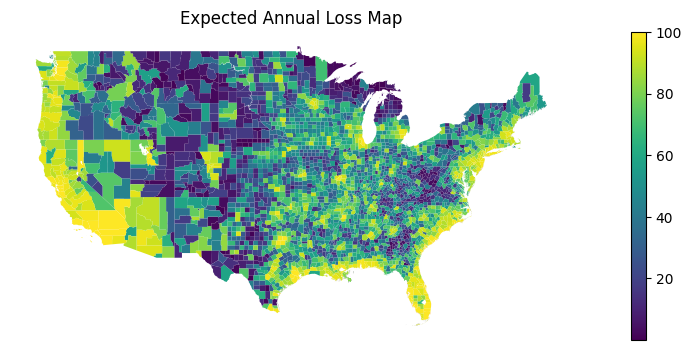

In [184]:
fig, ax = plt.subplots(figsize=(10,6))

gis_3 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'EAL_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_3.set_axis_off()
gis_3.set_title('Expected Annual Loss Map')

contextily.add_basemap(ax)

plt.savefig('gis_expannualloss_national_default.jpg')

plt.show()

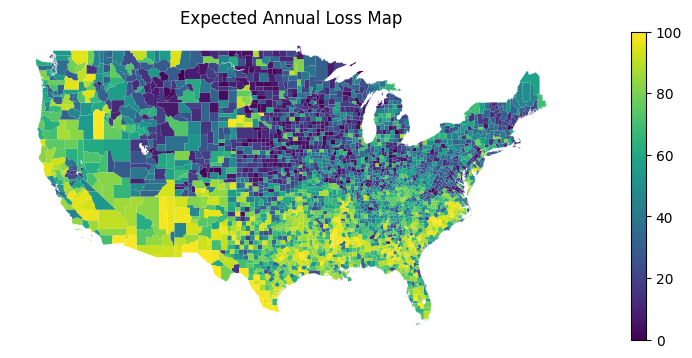

In [183]:
fig, ax = plt.subplots(figsize=(10,6))

gis_3 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'SOVI_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_3.set_axis_off()
gis_3.set_title('Social Vulnerability Map')

contextily.add_basemap(ax)

plt.savefig('gis_sovi_national_default.jpg')

plt.show()

In [169]:
southeast_states = ["Florida", "Georgia", "Tennessee", "North Carolina", "South Carolina", "Alabama", "Mississippi", "Kentucky", "West Virginia", "Virginia"]
southeast_states_filter = '|'.join(southeast_states)

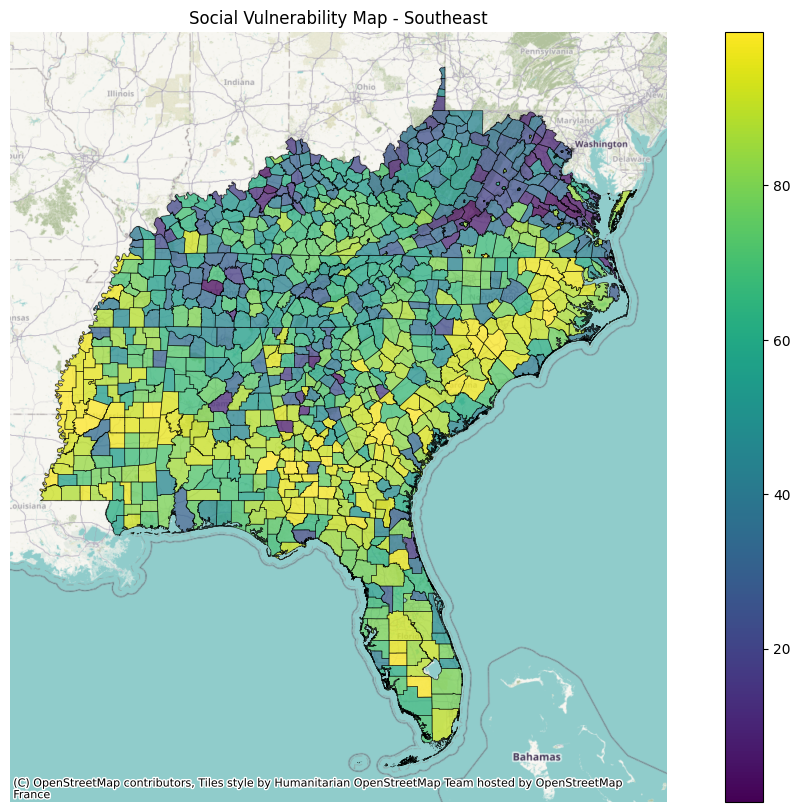

In [25]:
fig, ax = plt.subplots(figsize=(15,10))

gis_4 = shape_county[shape_county.STATE.str.contains(southeast_states_filter)].plot(column = 'SOVI_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)

gis_4.set_axis_off()
gis_4.set_title('Social Vulnerability Map - Southeast')

contextily.add_basemap(ax)

plt.savefig('gis_sovi_southeast_default.jpg')

plt.show()

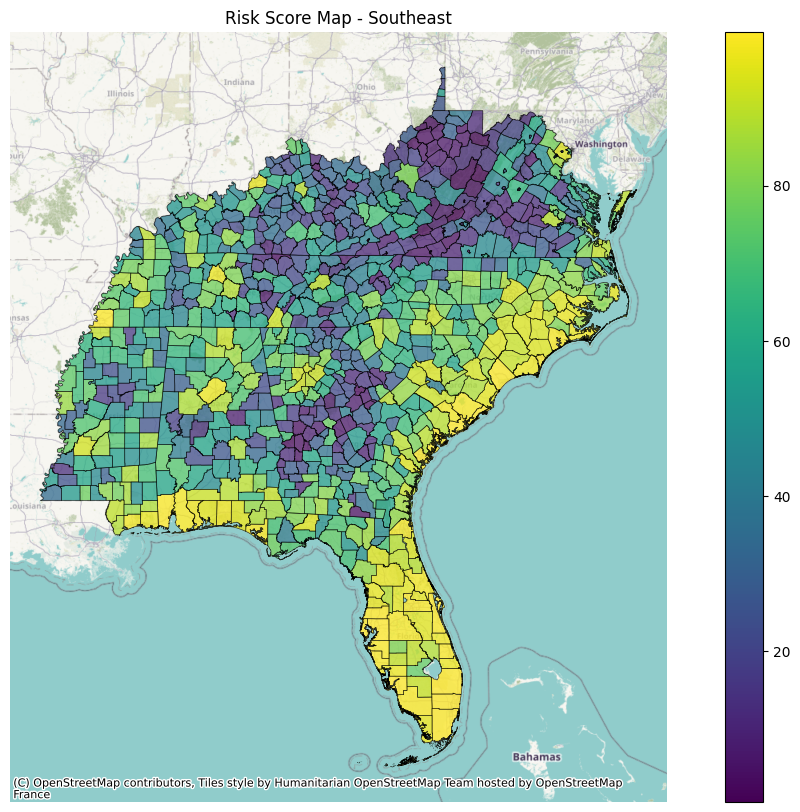

In [26]:
fig, ax = plt.subplots(figsize=(15,10))

gis_5 = shape_county[shape_county.STATE.str.contains(southeast_states_filter)].plot(column = 'RISK_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)

gis_5.set_axis_off()
gis_5.set_title('Risk Score Map - Southeast')

contextily.add_basemap(ax)

plt.savefig('gis_riskscore_southeast_default.jpg')

plt.show()

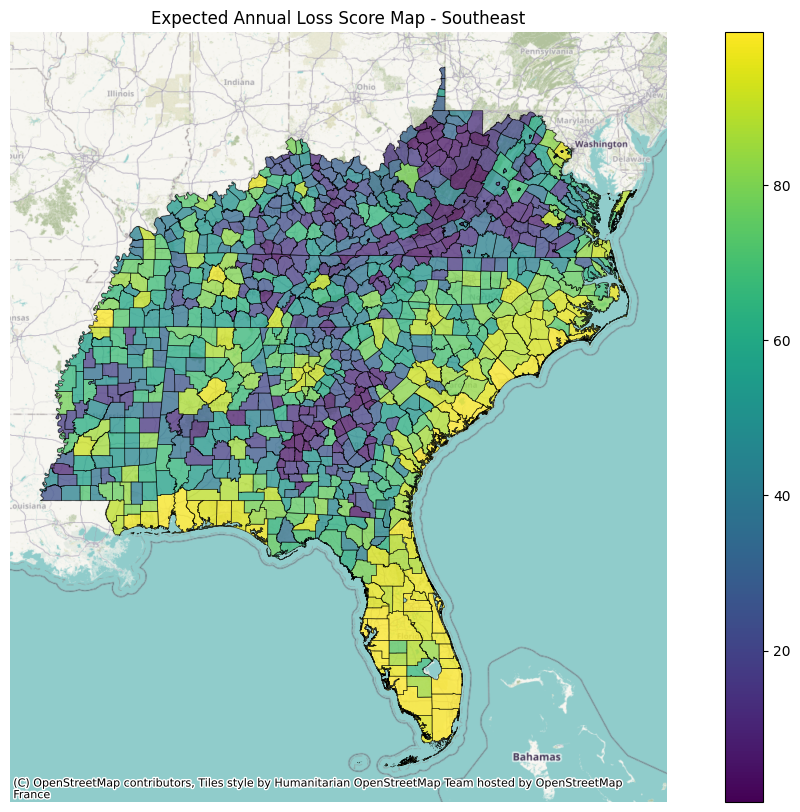

In [28]:
fig, ax = plt.subplots(figsize=(15,10))

gis_5 = shape_county[shape_county.STATE.str.contains(southeast_states_filter)].plot(column = 'EAL_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax, edgecolor = 'k', linewidth = .5, alpha = .75)

gis_5.set_axis_off()
gis_5.set_title('Expected Annual Loss Score Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_eal_southeast_default.jpg')

plt.show()

## Import Prediction Data

In [155]:
prediction_data_filtered = prediction_data.filter(["FIPS","Average_Number_of_Physically_Unhealthy_Days" ,
       'Average_Number_of_Mentally_Unhealthy_Days','Life_Expectancy',
       'Age_Adjusted_Death_Rate','Age_Adjusted_Death_Rate_mean_indicator',
       'Life_Expectancy_mean_indicator',
       'Physically_Unhealthy_Days_mean_indicator',
       'Mentally_Unhealthy_Days_mean_indicator',
       'AADR_Predicted', 'Life_Expectancy_Predicted',
       'Physically_Unhealtyh_Predicted', 'Mentally_Unhealthy_Predicted'])

In [154]:
prediction_data_filtered_southeast = prediction_data_southeast.filter(["FIPS",
       'SE_AADR_Predicted', 'SE_Life_Expectancy_Predicted',
       'SE_Physically_Unhealthy_Predicted', 'SE_Mentally_Unhealthy_Predicted'])

In [156]:
prediction_data_filtered['FIPS'] = prediction_data_filtered['FIPS'].astype(str).apply(lambda x: '0' + x if len(x) == 6 else x)
prediction_data_filtered['FIPS'] = prediction_data_filtered['FIPS'].astype(str).apply(lambda x: x[:5])
prediction_data_filtered['FIPS'] = prediction_data_filtered['FIPS'].astype(object)

In [158]:
prediction_data_filtered_southeast['FIPS'] = prediction_data_filtered_southeast['FIPS'].astype(str).apply(lambda x: '0' + x if len(x) == 6 else x)
prediction_data_filtered_southeast['FIPS'] = prediction_data_filtered_southeast['FIPS'].astype(str).apply(lambda x: x[:5])
prediction_data_filtered_southeast['FIPS'] = prediction_data_filtered_southeast['FIPS'].astype(object)

In [159]:
shape_county = shape_county.rename(columns = {'STCOFIPS': "FIPS"})

In [161]:
shape_county_merged = pd.merge(shape_county, prediction_data_filtered, how = "left", on = "FIPS")

In [162]:
shape_county_merged_southeast = pd.merge(shape_county_merged, prediction_data_filtered_southeast, how = "left", on = "FIPS")

In [165]:
shape_county_merged['Life_Expectancy_correct_prediction'] = (shape_county_merged['Life_Expectancy_mean_indicator'] == shape_county_merged['Life_Expectancy_Predicted']) 
shape_county_merged['AADR_correct_prediction'] = (shape_county_merged['Age_Adjusted_Death_Rate_mean_indicator'] == shape_county_merged['AADR_Predicted']) 
shape_county_merged['Mentally_Unhealthy_correct_prediction'] = (shape_county_merged['Mentally_Unhealthy_Days_mean_indicator'] == shape_county_merged['Mentally_Unhealthy_Predicted']) 
shape_county_merged['Physically_Unhealthy_correct_prediction'] = (shape_county_merged['Physically_Unhealthy_Days_mean_indicator'] == shape_county_merged['Physically_Unhealtyh_Predicted'])

In [168]:
shape_county_merged_southeast['SE_Life_Expectancy_correct_prediction'] = (shape_county_merged_southeast['Life_Expectancy_mean_indicator'] == shape_county_merged_southeast['SE_Life_Expectancy_Predicted']) 
shape_county_merged_southeast['SE_AADR_correct_prediction'] = (shape_county_merged_southeast['Age_Adjusted_Death_Rate_mean_indicator'] == shape_county_merged_southeast['SE_AADR_Predicted']) 
shape_county_merged_southeast['SE_Mentally_Unhealthy_correct_prediction'] = (shape_county_merged_southeast['Mentally_Unhealthy_Days_mean_indicator'] == shape_county_merged_southeast['SE_Mentally_Unhealthy_Predicted']) 
shape_county_merged_southeast['SE_Physically_Unhealthy_correct_prediction'] = (shape_county_merged_southeast['Physically_Unhealthy_Days_mean_indicator'] == shape_county_merged_southeast['SE_Physically_Unhealthy_Predicted'])  

### Life Expectancy Prediction Maps

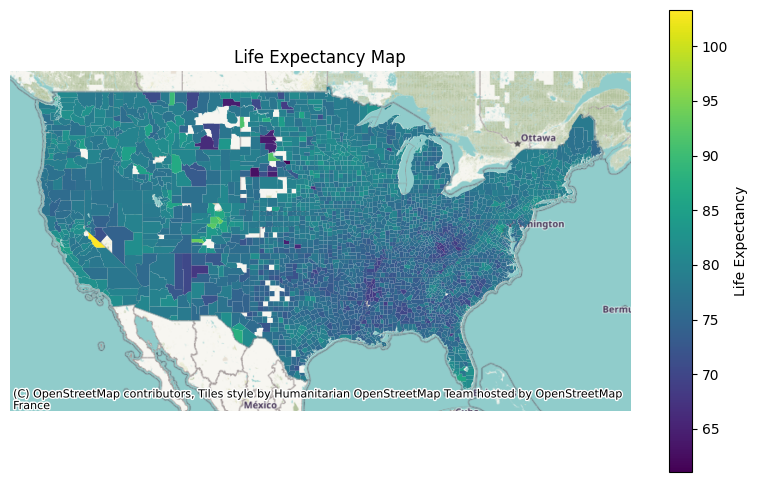

In [117]:
fig, ax = plt.subplots(figsize=(10,6))

gis_6 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Life_Expectancy',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Life Expectancy"},
                                                                       ax=ax)

gis_6.set_axis_off()
gis_6.set_title('Life Expectancy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

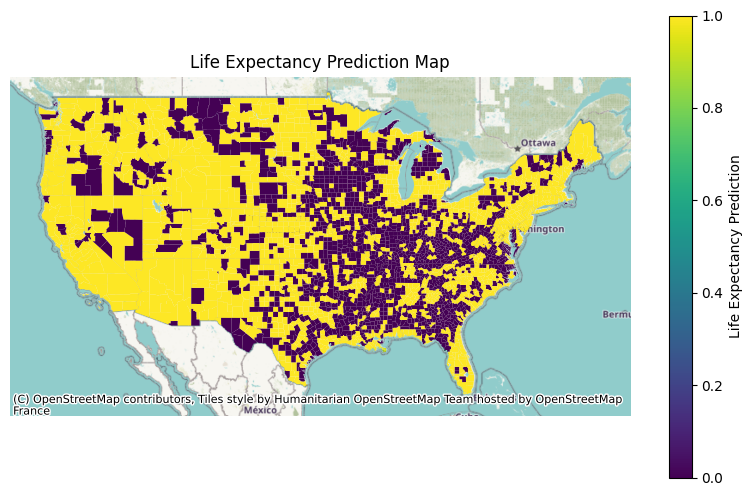

In [118]:
fig, ax = plt.subplots(figsize=(10,6))

gis_7 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Life_Expectancy_Predicted',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Life Expectancy Prediction"},
                                                                       ax=ax)

gis_7.set_axis_off()
gis_7.set_title('Life Expectancy Prediction Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

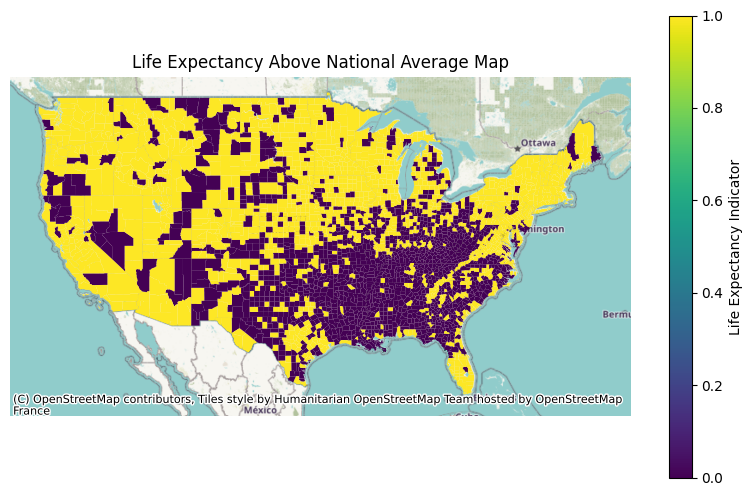

In [119]:
fig, ax = plt.subplots(figsize=(10,6))

gis_8 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Life_Expectancy_mean_indicator',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Life Expectancy Indicator"},
                                                                       ax=ax)

gis_8.set_axis_off()
gis_8.set_title('Life Expectancy Above National Average Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

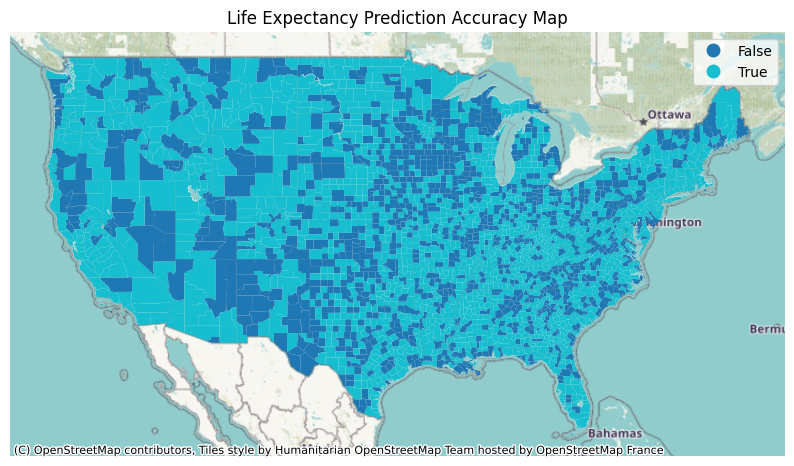

In [124]:
fig, ax = plt.subplots(figsize=(10,6))

gis_9 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Life_Expectancy_correct_prediction',
                                                                    
                                                                    legend = True,
                                                                       ax=ax)

gis_9.set_axis_off()
gis_9.set_title('Life Expectancy Prediction Accuracy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

### Age-Adjusted Death Rate Prediction

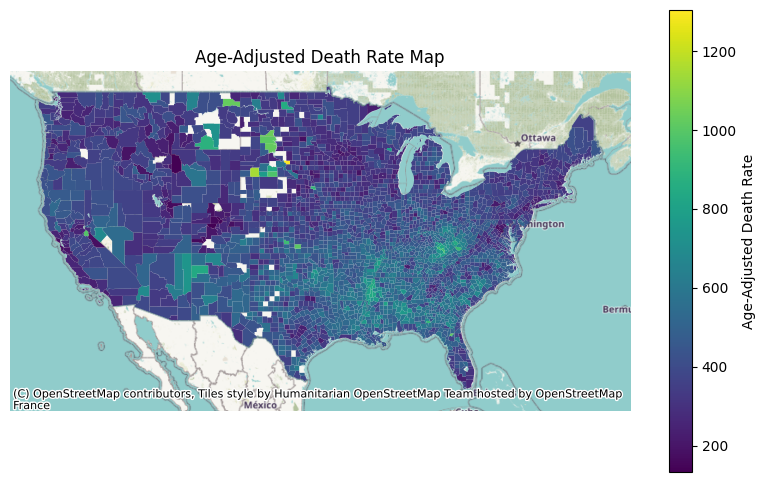

In [125]:
fig, ax = plt.subplots(figsize=(10,6))

gis_10 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Age_Adjusted_Death_Rate',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Age-Adjusted Death Rate"},
                                                                       ax=ax)

gis_10.set_axis_off()
gis_10.set_title('Age-Adjusted Death Rate Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

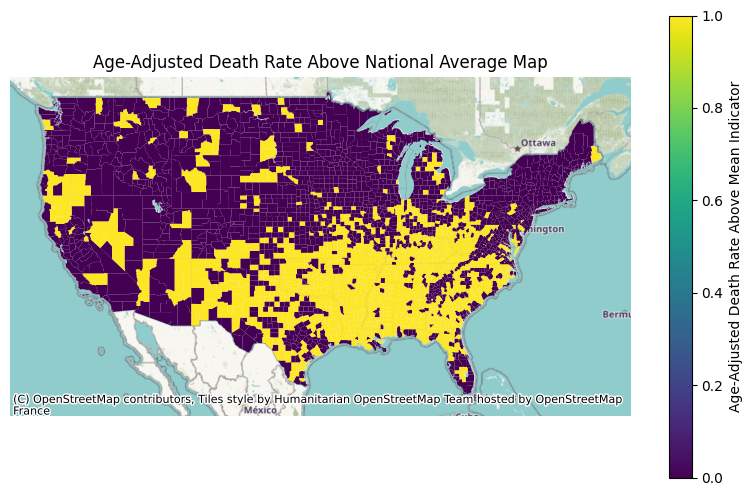

In [126]:
fig, ax = plt.subplots(figsize=(10,6))

gis_11 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Age_Adjusted_Death_Rate_mean_indicator',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Age-Adjusted Death Rate Above Mean Indicator"},
                                                                       ax=ax)

gis_11.set_axis_off()
gis_11.set_title('Age-Adjusted Death Rate Above National Average Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

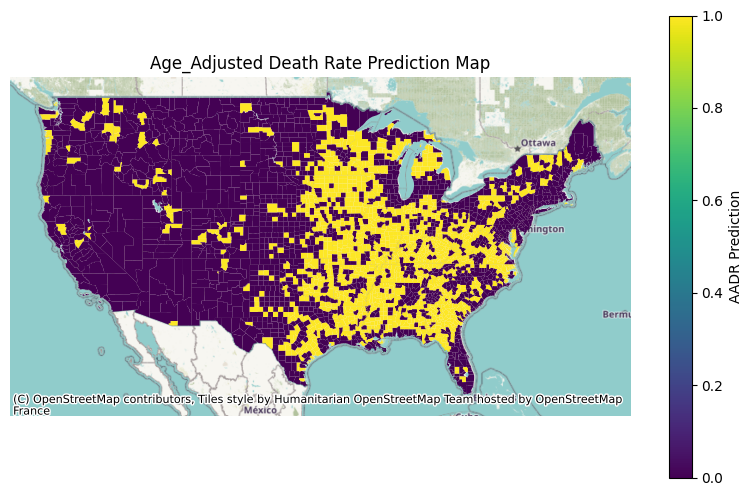

In [127]:
fig, ax = plt.subplots(figsize=(10,6))

gis_12 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'AADR_Predicted',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "AADR Prediction"},
                                                                       ax=ax)

gis_12.set_axis_off()
gis_12.set_title('Age_Adjusted Death Rate Prediction Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

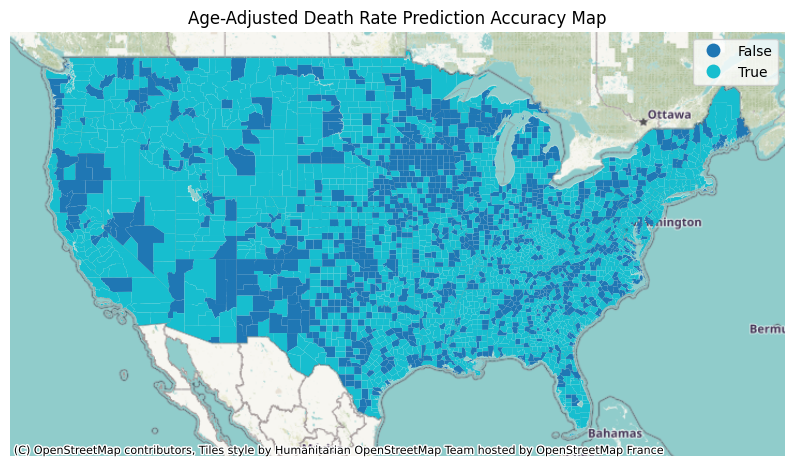

In [129]:
fig, ax = plt.subplots(figsize=(10,6))

gis_13 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'AADR_correct_prediction',
                                                                    
                                                                    legend = True,
                                                                       ax=ax)

gis_13.set_axis_off()
gis_13.set_title('Age-Adjusted Death Rate Prediction Accuracy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

### Number Physically Unhealthy Days

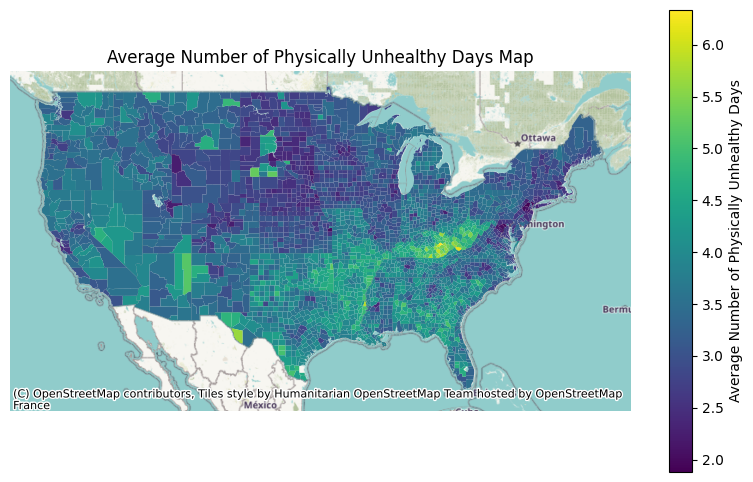

In [132]:
fig, ax = plt.subplots(figsize=(10,6))

gis_14 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Average_Number_of_Physically_Unhealthy_Days',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Average Number of Physically Unhealthy Days"},
                                                                       ax=ax)

gis_14.set_axis_off()
gis_14.set_title('Average Number of Physically Unhealthy Days Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

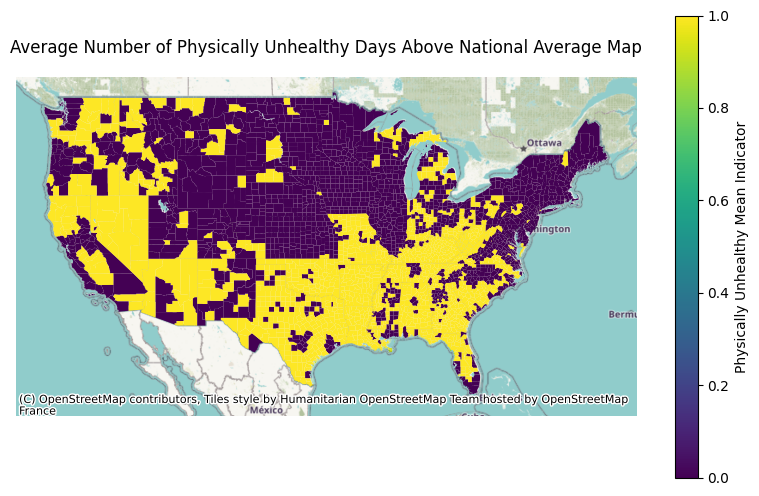

In [133]:
fig, ax = plt.subplots(figsize=(10,6))

gis_15 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Physically_Unhealthy_Days_mean_indicator',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Physically Unhealthy Mean Indicator"},
                                                                       ax=ax)

gis_15.set_axis_off()
gis_15.set_title('Average Number of Physically Unhealthy Days Above National Average Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

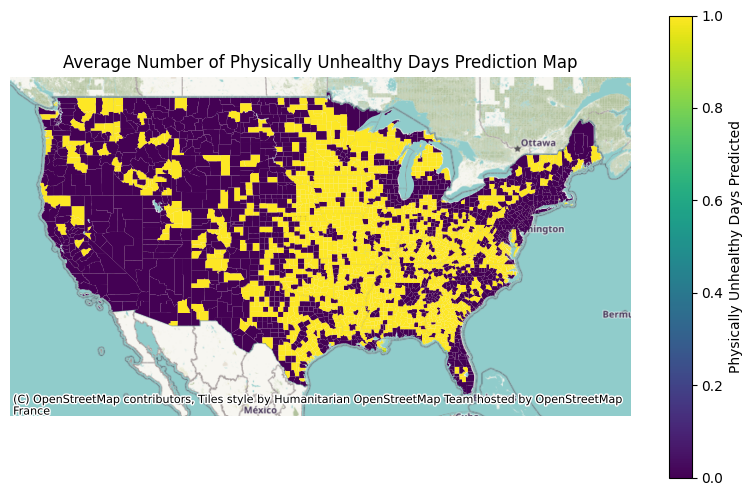

In [134]:
fig, ax = plt.subplots(figsize=(10,6))

gis_16 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Physically_Unhealtyh_Predicted',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Physically Unhealthy Days Predicted"},
                                                                       ax=ax)

gis_16.set_axis_off()
gis_16.set_title('Average Number of Physically Unhealthy Days Prediction Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

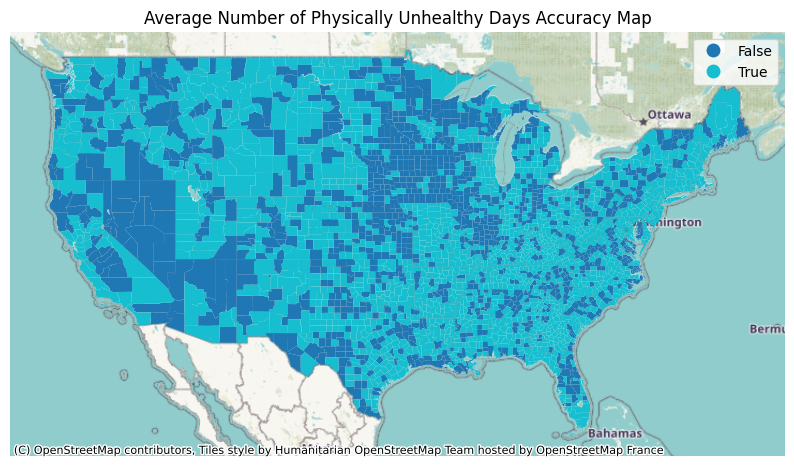

In [135]:
fig, ax = plt.subplots(figsize=(10,6))

gis_17 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Physically_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_17.set_axis_off()
gis_17.set_title('Average Number of Physically Unhealthy Days Accuracy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

### Mentally Unhealthy Days

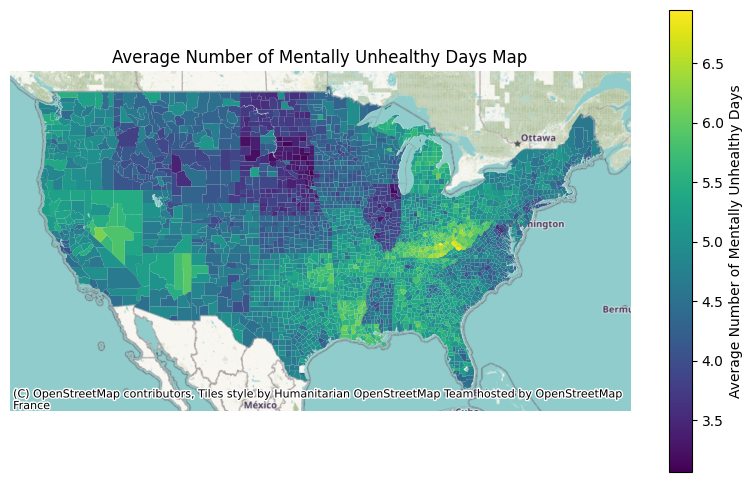

In [136]:
fig, ax = plt.subplots(figsize=(10,6))

gis_18 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Average_Number_of_Mentally_Unhealthy_Days',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Average Number of Mentally Unhealthy Days"},
                                                                       ax=ax)

gis_18.set_axis_off()
gis_18.set_title('Average Number of Mentally Unhealthy Days Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

# This graph is the most interesting so far to me, you can see how distinct the state lines are in colors, could be because of statewide policies surrounding mental health

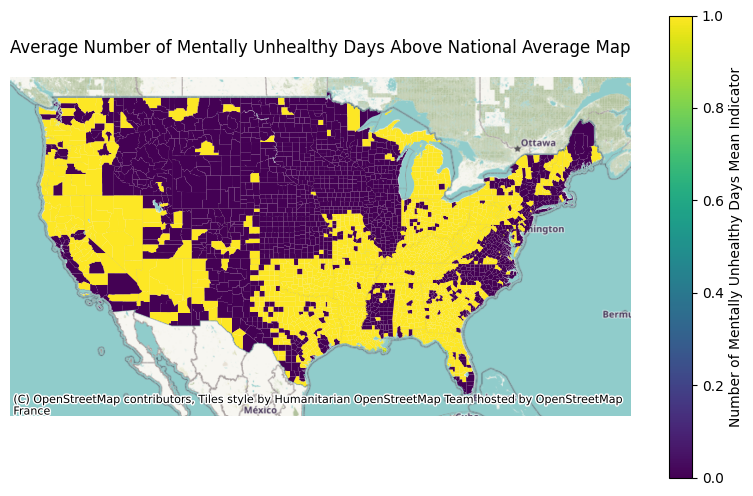

In [137]:
fig, ax = plt.subplots(figsize=(10,6))

gis_19 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Mentally_Unhealthy_Days_mean_indicator',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Number of Mentally Unhealthy Days Mean Indicator"},
                                                                       ax=ax)

gis_19.set_axis_off()
gis_19.set_title('Average Number of Mentally Unhealthy Days Above National Average Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

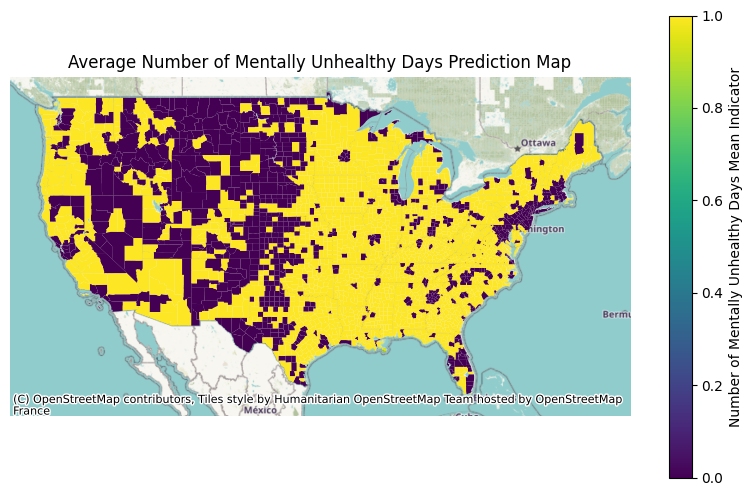

In [139]:
fig, ax = plt.subplots(figsize=(10,6))

gis_20 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Mentally_Unhealthy_Predicted',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Number of Mentally Unhealthy Days Mean Indicator"},
                                                                       ax=ax)

gis_20.set_axis_off()
gis_20.set_title('Average Number of Mentally Unhealthy Days Prediction Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

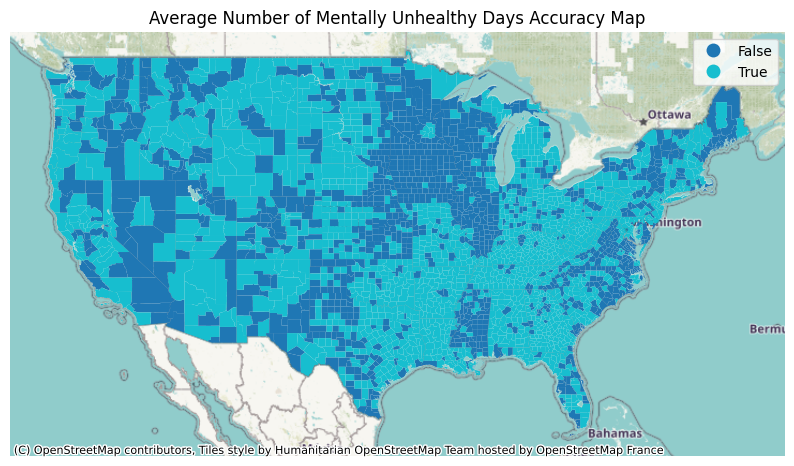

In [140]:
fig, ax = plt.subplots(figsize=(10,6))

gis_21 = shape_county_merged[~shape_county_merged.STATE.str.contains("Alaska|Hawaii")].plot(column = 'Mentally_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_21.set_axis_off()
gis_21.set_title('Average Number of Mentally Unhealthy Days Accuracy Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

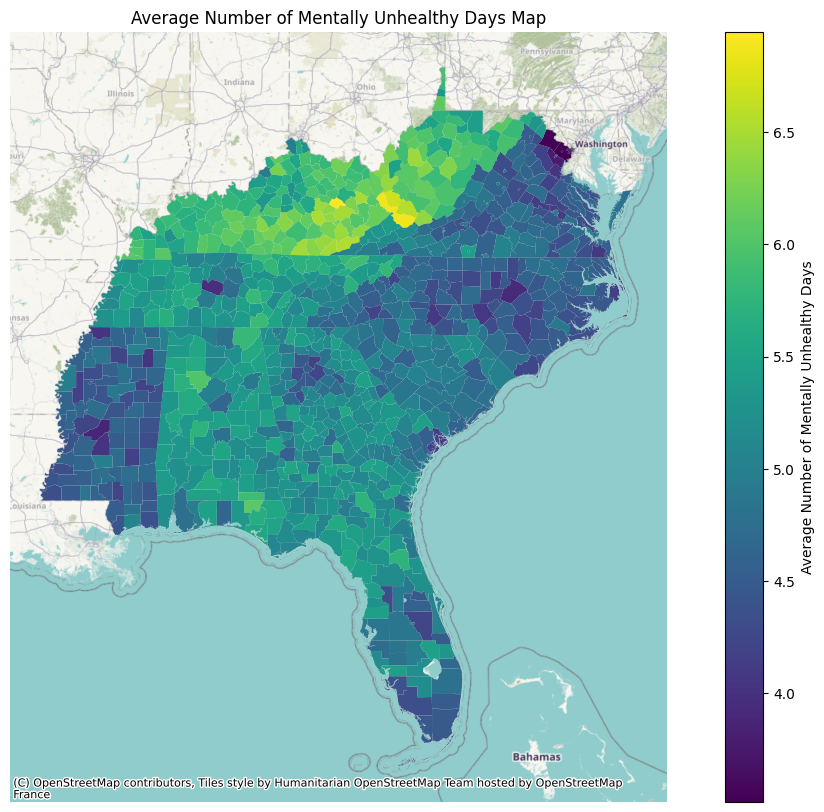

In [175]:
fig, ax = plt.subplots(figsize=(15,10))

gis_22 = shape_county_merged[shape_county_merged.STATE.str.contains(southeast_states_filter)].plot(column = 'Average_Number_of_Mentally_Unhealthy_Days',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Average Number of Mentally Unhealthy Days"},
                                                                       ax=ax)

gis_22.set_axis_off()
gis_22.set_title('Average Number of Mentally Unhealthy Days Map')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

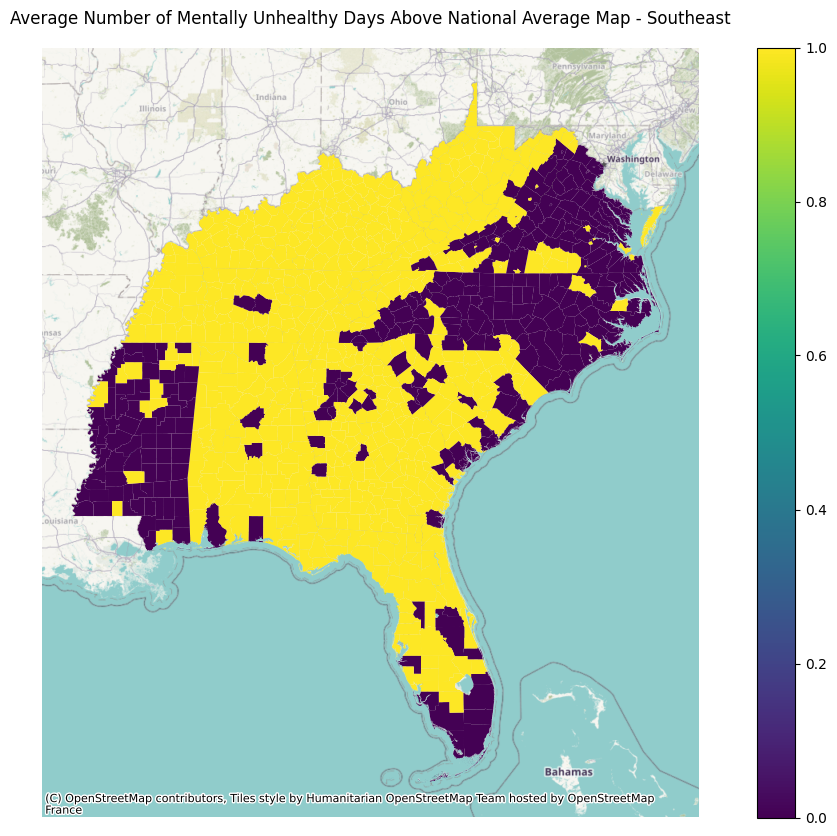

In [176]:
fig, ax = plt.subplots(figsize=(15,10))

gis_22 = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)].plot(column = 'Mentally_Unhealthy_Days_mean_indicator',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_22.set_axis_off()
gis_22.set_title('Average Number of Mentally Unhealthy Days Above National Average Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

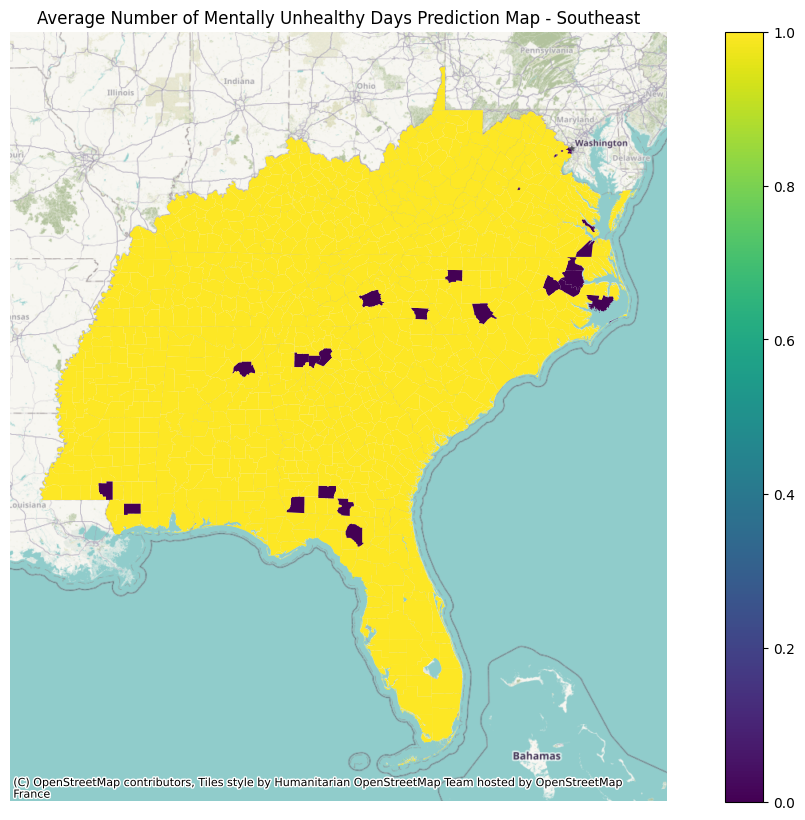

In [177]:
fig, ax = plt.subplots(figsize=(15,10))

gis_22 = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)].plot(column = 'SE_Mentally_Unhealthy_Predicted',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_22.set_axis_off()
gis_22.set_title('Average Number of Mentally Unhealthy Days Prediction Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()

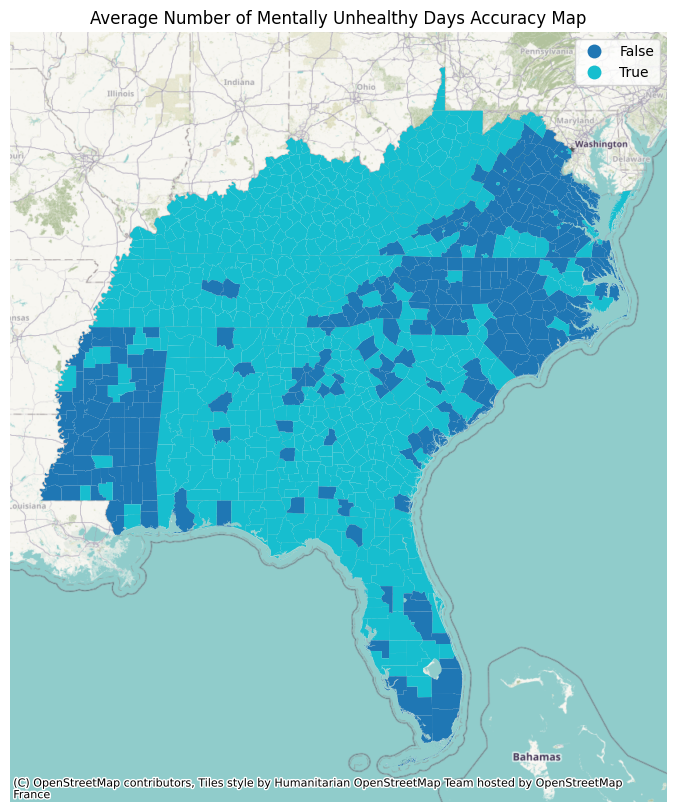

In [172]:
fig, ax = plt.subplots(figsize=(15,10))

gis_22 = shape_county_merged_southeast[shape_county_merged_southeast.STATE.str.contains(southeast_states_filter)].plot(column = 'SE_Mentally_Unhealthy_correct_prediction',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_22.set_axis_off()
gis_22.set_title('Average Number of Mentally Unhealthy Days Accuracy Map - Southeast')

contextily.add_basemap(ax)

#plt.savefig('gis_riskscore_national_red.jpg')

plt.show()